In [115]:
import sisl
import sisl.viz
import plotly.express as px

# Estructura electrònica del grafé i el nitrur de bor amb SIESTA


In [138]:
# Generem el hamiltonià pel grafé (l'anomenem "C") i pel nitrur de bor (l'anomenem "BN")
c = sisl.get_sile("graphene/inputs/geom_C.fdf").read_hamiltonian()
BN = sisl.get_sile("boron_nitride/inputs/geom_BN.fdf").read_hamiltonian()

## 1. Diagrama de bandes

Els **diagrames de bandes** són representacions gràfiques de l'estructura de bandes d'energia d'un material sòlid en funció del vector dona. Les **bandes d'energia** corresponen als nivells d'energia permessos pels electrons en un material sòlid.

### 1.1. Diagrama de bandes del grafé

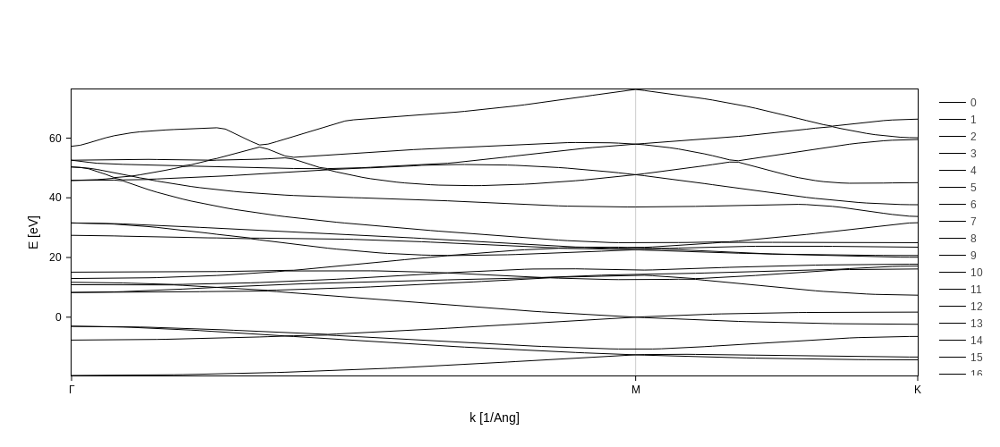

In [140]:
# We need to define a path of k points
band_struct_C = sisl.BandStructure(C, points=[[0, 0, 0], [2/3, 1/3, 0], [1/2, 0, 0]],
    divisions=100, names=[r"Γ", "M", "K"]
)
# Then we can plot the bands
band_struct_C.plot().update_layout(height=500)

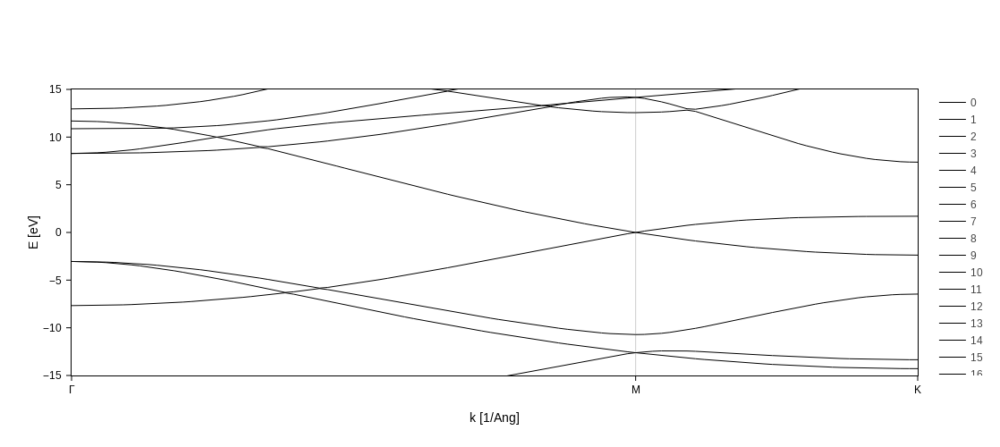

In [143]:
# Ampliem el rang de les bandes per valors d'energia propers a zero.
band_struct_C.plot().update_layout(height=500, yaxis=dict(range=[-15, 15]))

### 1.2. Diagrama de bandes del nitrur de bor

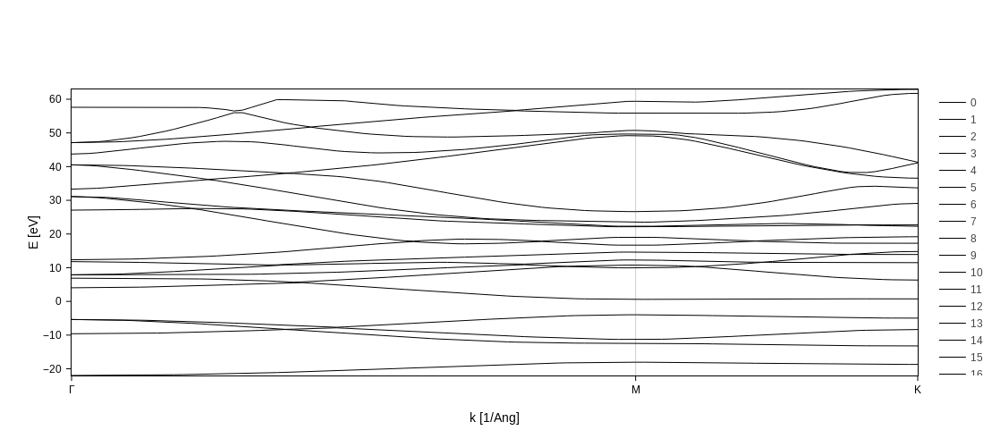

In [147]:
# We need to define a path of k points
band_struct_BN = sisl.BandStructure(BN, points=[[0, 0, 0], [2/3, 1/3, 0], [1/2, 0, 0]],
    divisions=100, names=[r"Γ", "M", "K"]
)
# Then we can plot the bands
band_struct_BN.plot().update_layout(height=500)

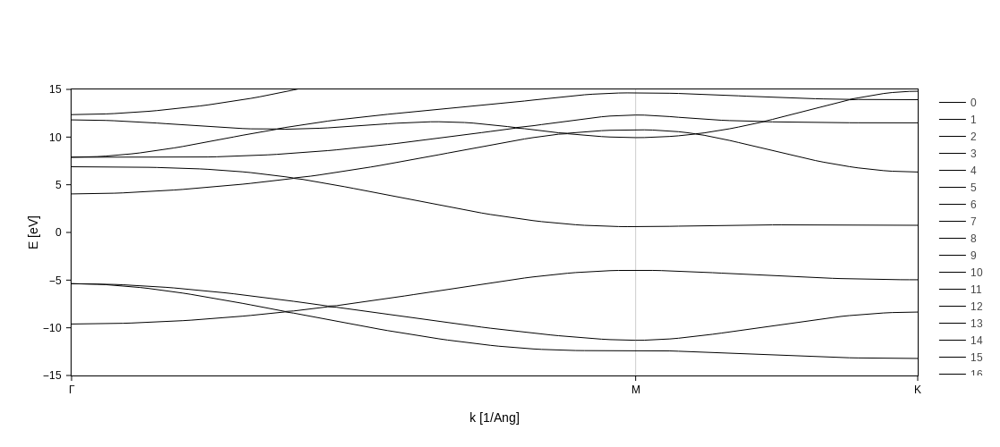

In [148]:
# Ampliem el rang de les bandes per valors d'energia propers a zero.
band_struct_BN.plot().update_layout(height=500, yaxis=dict(range=[-15, 15]))

## 2. Bandes amples (*Fatbands*)

Les **bandes amples** (*fatbands*) són una representació de les contribucions inidividuals dels orbitals atòmics a cadascuna de les bandes electròniques en un material.

### 2.1. Bandes amples del grafé

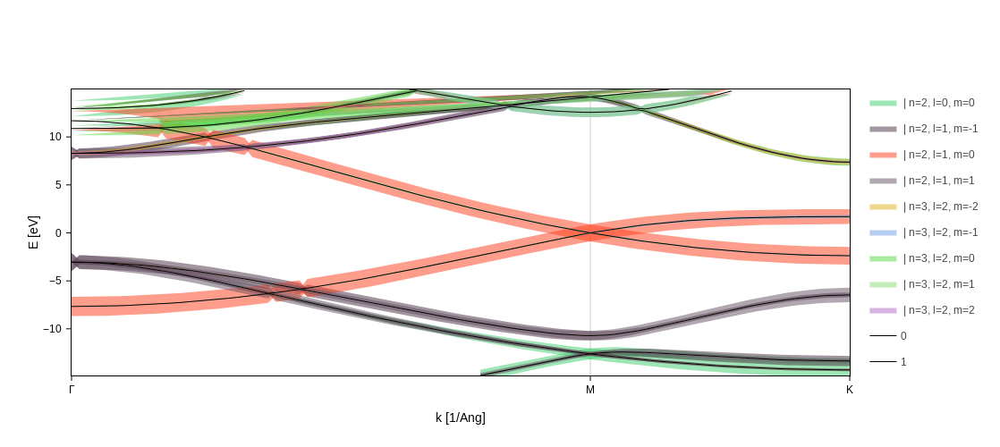

In [152]:
# Get the fatbands plot
fatbands_C = band_struct_C.plot.fatbands(Erange=[-15,15])
# Split the contributions by the n, l and m quantum numbers
fatbands_C.split_groups(on="n+l+m", scale=2)
fatbands_C.update_layout(height=500)

### 2.2. Bandes amples del nitrur de bor

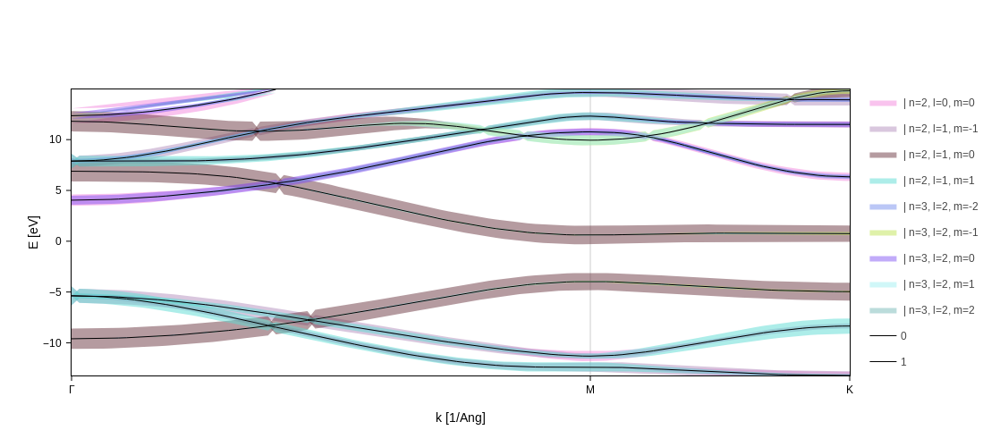

In [153]:
# Get the fatbands plot
fatbands_BN = band_struct_BN.plot.fatbands(Erange=[-15,15])
# Split the contributions by the n, l and m quantum numbers
fatbands_BN.split_groups(on="n+l+m", scale=2)
fatbands_BN.update_layout(height=500)

## 3. PDOS (*projected density of states*)

La **densitat d'estats projectada** (PDOS) dona informació sobre la densitat d'estats electrònics en funció de l'energia i l'orbita de les bandes en un material.

### 3.1. PDOS del grafé

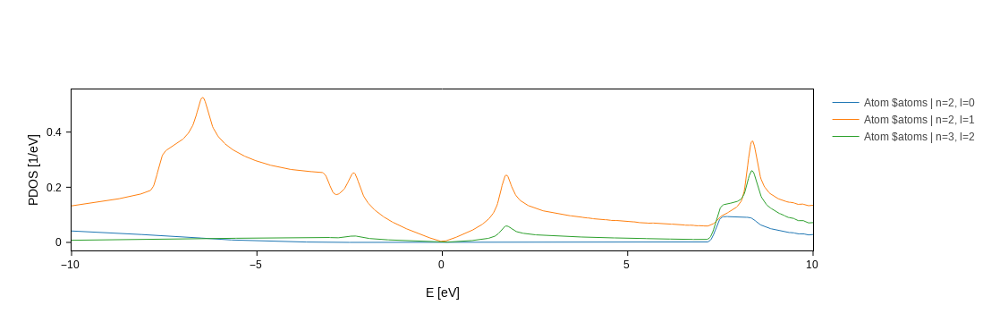

In [155]:
# Get the PDOS plot
pdos_plot_C1 = C.plot.pdos(
    kgrid=[90,90,1], nE=1000, data_Erange=[-10, 10], Erange=[-10, 10],
    distribution=sisl.get_distribution(method="gaussian", smearing=0.1)
)
# Split the contributions by the n and l quantum numbers
pdos_plot_C1.split_DOS(on="n+l", name="Atom $atoms")

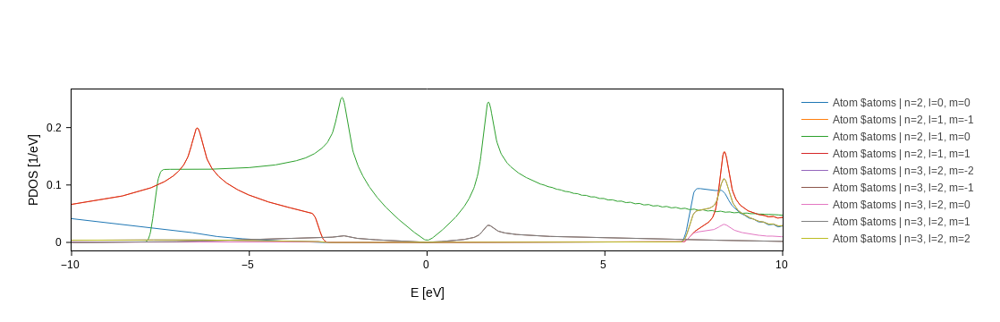

In [156]:
# Get the PDOS plot
pdos_plot_C2 = C.plot.pdos(
    kgrid=[90,90,1], nE=1000, data_Erange=[-10, 10], Erange=[-10, 10],
    distribution=sisl.get_distribution(method="gaussian", smearing=0.1)
)
# Split the contributions by the n, l and m quantum numbers
pdos_plot_C2.split_DOS(on="n+l+m", name="Atom $atoms")

### 3.2. PDOS del nitrur de bor

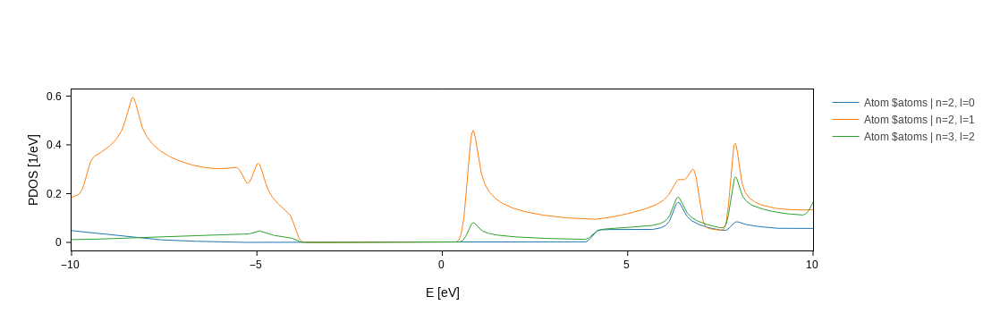

In [158]:
# Get the PDOS plot
pdos_plot_BN1 = BN.plot.pdos(
    kgrid=[90,90,1], nE=1000, data_Erange=[-10, 10], Erange=[-10, 10],
    distribution=sisl.get_distribution(method="gaussian", smearing=0.1)
)
# Split the contributions by the n and l quantum numbers
pdos_plot_BN1.split_DOS(on="n+l", name="Atom $atoms")

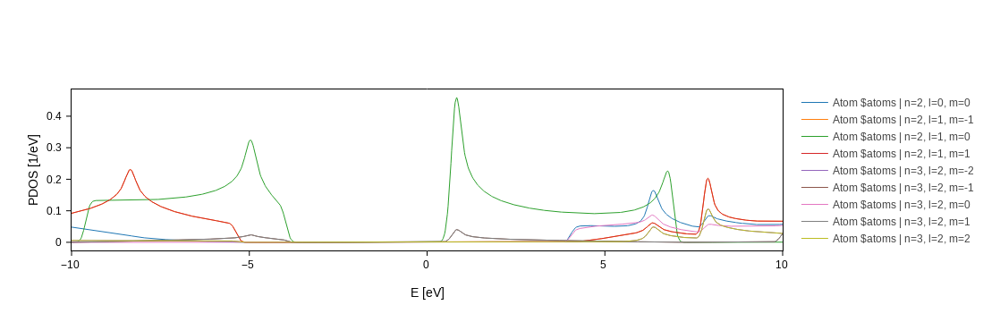

In [157]:
# Get the PDOS plot
pdos_plot_BN2 = BN.plot.pdos(
    kgrid=[90,90,1], nE=1000, data_Erange=[-10, 10], Erange=[-10, 10],
    distribution=sisl.get_distribution(method="gaussian", smearing=0.1)
)
# Split the contributions by the n, l and m quantum numbers
pdos_plot_BN2.split_DOS(on="n+l+m", name="Atom $atoms")

## 4. Densitat electrònica

### 4.1. Densitat electrònica del grafé

dep:0: SislDeprecation:

__init__ argument bc has been deprecated (removed) in favor of the boundary conditions in Lattice, please update your code. [>=0.15.0]



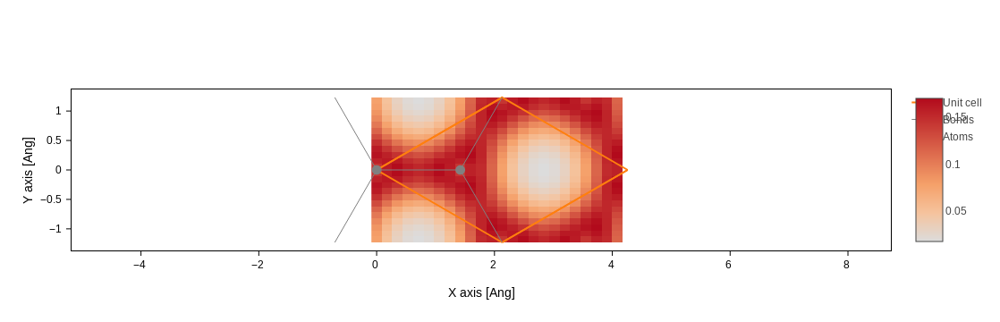

In [159]:
rho_C = sisl.get_sile("graphene/inputs/geom_C.fdf").read_grid("RHO")
rho_C.plot(axes="xy", plot_geom=True)

### 4.2. Densitat electrònica del nitrur de bor

dep:0: SislDeprecation:

__init__ argument bc has been deprecated (removed) in favor of the boundary conditions in Lattice, please update your code. [>=0.15.0]



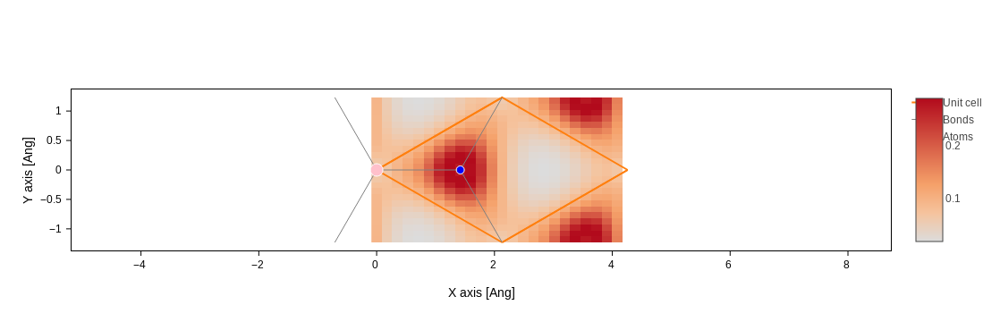

In [160]:
rho_BN = sisl.get_sile("boron_nitride/inputs/geom_BN.fdf").read_grid("RHO")
rho_BN.plot(axes="xy", plot_geom=True)